In [2]:
!pip install geopandas

   ---------------------------------------- 0.0/16.2 MB ? eta -:--:--
   ---------------------------------------- 0.0/16.2 MB ? eta -:--:--
   ---------------------------------------- 0.0/16.2 MB ? eta -:--:--
    --------------------------------------- 0.3/16.2 MB ? eta -:--:--
    --------------------------------------- 0.3/16.2 MB ? eta -:--:--
    --------------------------------------- 0.3/16.2 MB ? eta -:--:--
   - -------------------------------------- 0.5/16.2 MB 465.6 kB/s eta 0:00:34
   - -------------------------------------- 0.5/16.2 MB 465.6 kB/s eta 0:00:34
   - -------------------------------------- 0.5/16.2 MB 465.6 kB/s eta 0:00:34
   - -------------------------------------- 0.5/16.2 MB 465.6 kB/s eta 0:00:34
   - -------------------------------------- 0.5/16.2 MB 465.6 kB/s eta 0:00:34
   - -------------------------------------- 0.5/16.2 MB 465.6 kB/s eta 0:00:34
   - -------------------------------------- 0.5/16.2 MB 465.6 kB/s eta 0:00:34
   - ----------------------

In [3]:
import geopandas as gpd

In [4]:
gdf = gpd.read_file('tl_bus_station_info.shp')

In [5]:
gdf

,arsno,bstopid,bstopnm,gpsx,gpsy,stoptype,geometry
0,01001,167970102,영주삼거리,129.033262,35.115323,일반,POINT (129.03326 35.11532)
1,01002,169310303,영주삼거리,129.033030,35.115283,일반,POINT (129.03303 35.11528)
2,01003,167970301,시민아파트,129.031678,35.115075,일반,POINT (129.03168 35.11508)
3,01004,167840102,시민아파트,129.032160,35.114921,일반,POINT (129.03216 35.11492)
4,01005,167970302,중앙공원.민주공원입구,129.029858,35.114473,일반,POINT (129.02986 35.11447)
...,...,...,...,...,...,...,...
8517,---,510740000,좌2동행정복지센터,129.183119,35.169047,마을,POINT (129.18312 35.16905)
8518,---,510750000,좌동재래시장,129.172913,35.173195,마을,POINT (129.17291 35.1732)
8519,---,510760000,좌동재래시장,129.173247,35.173347,마을,POINT (129.17325 35.17335)
8520,---,510770000,한마음스포츠센터,129.177295,35.180100,마을,POINT (129.1773 35.1801)


In [8]:
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 8522 entries, 0 to 8521
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   arsno     8522 non-null   object  
 1   bstopid   8522 non-null   int64   
 2   bstopnm   8522 non-null   object  
 3   gpsx      8522 non-null   float64 
 4   gpsy      8522 non-null   float64 
 5   stoptype  8522 non-null   object  
 6   geometry  8522 non-null   geometry
dtypes: float64(2), geometry(1), int64(1), object(3)
memory usage: 466.2+ KB


<Axes: >

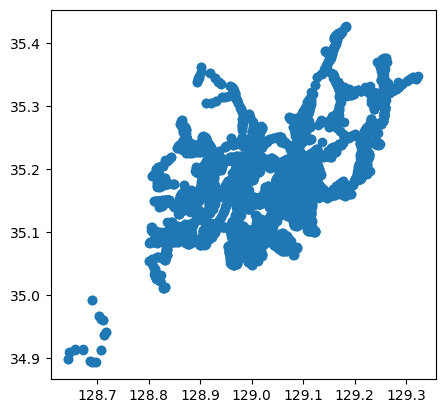

In [6]:
gdf.plot()

In [21]:
type(jsonData_busan)

dict

In [20]:
gdf = gdf.to_crs(jsonData_busan.crs)

AttributeError: 'dict' object has no attribute 'crs'

In [12]:
import folium
from folium.plugins import MarkerCluster

# 지도 생성
m = folium.Map(location=[35.1796, 129.0756], zoom_start=12)

# 클러스터 객체 생성
marker_cluster = MarkerCluster().add_to(m)

# 클러스터에 마커 추가
for _, row in gdf.iterrows():
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        popup=row['bstopnm']
    ).add_to(marker_cluster)

m

In [15]:
import pandas as pd

data = pd.read_csv('202412_202412_주민등록인구및세대현황_월간.csv',encoding = 'cp949')

data['행정구역'] = data['행정구역'].str.split('(').str.get(0).str.strip()

data.columns = ['행정구역', '총인구수', '세대수', '세대당인구', '남자', '여자', '남여비율']

data.drop(['남여비율'],axis='columns',inplace=True)

data['시'] = data['행정구역'].str.split().str.get(0)
data['구'] = data['행정구역'].str.split().str.get(1)
data['동'] = data['행정구역'].str.split().str.get(2)
busan = data[data['시']=='부산광역시']

busan = busan.dropna()
busan.reset_index(inplace = True, drop = True) #drop = True를 안해주면 
busan.head()

busan['총인구수'] = busan['총인구수'].str.replace(',','').astype('int')
busan['남자'] = busan['남자'].str.replace(',','').astype('int')
busan['여자'] = busan['여자'].str.replace(',','').astype('int')

bugan_d = busan.groupby('동')['총인구수'].sum().sort_values(ascending = False)
busan_d = bugan_d.reset_index()

In [16]:
busan_d

,동,총인구수
0,정관읍,78483
1,명지1동,54275
2,기장읍,51101
3,용호제1동,42454
4,화명제1동,39212
...,...,...
200,가락동,2082
201,선두구동,2016
202,금성동,902
203,광복동,859


In [17]:
import json

jsonfile = open('HangJeongDong_ver20241001.geojson', 'r', encoding = 'utf-8').read()
jsonData = json.loads(jsonfile)

jsonData_busan = {'type': 'FeatureCollection'}

jsonData_pick = []
jsonData_dong = []

for idx in jsonData['features'] :
    if idx['properties']['sidonm'] == '부산광역시' : 
        dong = idx['properties']['adm_nm'].split()[-1].strip()
        if dong == '가야제1동' :
            dong = '가야1동'
        idx['id'] = dong
        jsonData_dong.append(dong)
        jsonData_pick.append(idx)

jsonData_busan['features'] = jsonData_pick
jsonData_busan

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'properties': {'adm_nm': '부산광역시 중구 중앙동',
    'adm_cd2': '2611051000',
    'sgg': '26110',
    'sido': '26',
    'sidonm': '부산광역시',
    'sggnm': '중구',
    'adm_cd': '21010510'},
   'geometry': {'type': 'MultiPolygon',
    'coordinates': [[[[129.04001607594367, 35.111424681628996],
       [129.0427298111509, 35.11072215883535],
       [129.042347191582, 35.11034344765853],
       [129.0423152220015, 35.110297967631624],
       [129.041990699126, 35.10982871044188],
       [129.0414304709214, 35.109010295030885],
       [129.04088010913745, 35.10811134155702],
       [129.0445525636584, 35.10580584261088],
       [129.04373774886275, 35.10492439441351],
       [129.04036624750276, 35.10703056658817],
       [129.0398182034819, 35.10584181288946],
       [129.0399339281879, 35.10576888949395],
       [129.04367586047277, 35.103410637547064],
       [129.04224004979767, 35.10191413106284],
       [129.0399974305661, 35.10287